<p style='text-align: justify;'>
<b>Author</b>: Abzer Kelminal (abzer.shah@uni-tuebingen.de) adapted from the scripts of Madeleine Ernst (mernst@ucsd.edu), Ricardo Silva (ridasilva@ucsd.edu) <br>
<b>Edited by</b>: - <br>
<b>Use case</b>: Test for association between paired samples (feature vs metadata and feature vs feature), using the Pearson's product moment correlation coefficient. The Notebook combines the asv and feature tables and creates a decoy set, calculates the correlation scores for both target and decoy tables. Finally, FDR is also calculated<br>
<b>Input file format</b>: .csv tables of asv files and feature table. <br>
<b>Outputs</b>: .csv table showing correlation coefficient values  <br>
<b>Dependencies</b>: R version 3.4.2 (2017-09-28) and libraries  ggplot2, dplyr, varhandle, reshape2</p>

## Load the ASVs and Feature table

In [ ]:
install.packages(c("ggplot2","dplyr","varhandle","reshape2","svglite")) 

In [1]:
require(ggplot2) #For Plots
require(dplyr)  # For data manipulation
require(varhandle) # Mainly for using unfactor function to convert factor to integer values
require(reshape2) # Mainly for using 'melt' function
require(svglite) #to save plots in svg format

Loading required package: ggplot2

Loading required package: dplyr

Warning message:
"package 'dplyr' was built under R version 3.6.3"

Attaching package: 'dplyr'


The following objects are masked from 'package:stats':

    filter, lag


The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union


Loading required package: varhandle

Warning message:
"package 'varhandle' was built under R version 3.6.2"
Loading required package: reshape2

Warning message:
"package 'reshape2' was built under R version 3.6.3"
Loading required package: svglite

Warning message:
"package 'svglite' was built under R version 3.6.3"


#### 'Global' settings for plot size in the output cell:

In [2]:
#options(repr.plot.width=10, repr.plot.height=8,res=600) #For google collab
options(repr.plot.width=6, repr.plot.height=6) #For Jupyter Notebook

In [3]:
# setting the current directory as the working directory
Directory <- normalizePath(readline("Enter the path of the folder with input files: "),"/",mustWork=FALSE)
setwd(Directory)

Enter the path of the folder with input files: D:\Projects\cce github\Outputs\Correlation_Analysis


In [4]:
asv16s <- read.csv("ASV_16S_With_Metadata.csv",header=TRUE,check.names = FALSE,row.names = 1)
asv18s <- read.csv("ASV_18SV9_FullDepth_With_Metadata.csv",header=TRUE,check.names = FALSE,row.names = 1)
FT <-  read.csv("Normalised_Quant_table_FixedData.csv",header=TRUE,check.names = FALSE,row.names = 1)
#"2022-11-15_Imputed_QuantTable_filled_with_1000_CutOff_Used_0.3.csv"
#"Normalised_Quant_table_FixedData.csv"

Note that the asv files used are the ones with meatadata combined with them.

In [39]:
head(asv16s)
dim(asv16s)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml,Class16S,Confidence,Domain16S,Family16S,Genus16S,Order16S,Phylum16S,Species16S
00208b62ef66aa36e069777b853c8f17,0,0,0,0,0,0,0,0,0,0,...,0,0,Deltaproteobacteria,0.8284995,Bacteria,NA,NA,SAR324 clade(Marine group B),Proteobacteria,NA
00232f374cfc930f3fffbaef0d0c6d80,0,0,0,0,0,0,0,0,0,0,...,0,0,Gammaproteobacteria,1.0000000,Bacteria,NA,NA,NA,Proteobacteria,NA
0023a8c071538909ed3386e4e1d52278,0,0,0,0,0,0,0,0,0,0,...,0,0,Ignavibacteria,0.7360358,Bacteria,uncultured organism,uncultured organism,OPB56,Bacteroidetes,uncultured organism
00256e2eb0d211a7498c3e8b3170cedd,0,0,0,0,0,0,7,0,0,0,...,0,0,NA,0.9999943,Bacteria,NA,NA,NA,Marinimicrobia (SAR406 clade),NA
002ae12276a5da377dd6f7d5452a388a,0,0,0,0,0,0,10,0,0,0,...,0,0,Bacteroidia,0.9964438,Bacteria,NS9 marine group,NA,Flavobacteriales,Bacteroidetes,NA
002c14075180e4484913e02e02dead50,0,0,0,0,0,0,0,0,0,0,...,0,0,Bacteroidia,0.9999990,Bacteria,Crocinitomicaceae,Crocinitomix,Flavobacteriales,Bacteroidetes,uncultured Bacteroidetes/Chlorobi group bacterium


[1] 7538   79

<p style='text-align: justify;'>The observed dimension above was 7538 rows and 79 columns. Out of this 79, <b> 8 columns were metadata info </b> (Class16S, Confidence, Domain16S, Family16S, Genus16S, Order16S, Phylum16S, Species16S). Thus, 71 files in asv16s dataframe.</p>

In [40]:
head(asv18s)
dim(asv18s)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,Class18SV9,Confidence,Domain18SV9,Family18SV9,Genus18SV9,Kingdom18SV9,Order18SV9,Phylum18SV9,Species18SV9,X
000167ce642266c21c62843e4a010266,0,0,0,0,0,0,0,0,0,0,...,Acantharea,0.9991760,Eukaryota,Acantharea_XX,Acantharea_XXX,Rhizaria,Acantharea_X,Radiolaria,Acantharea_XXX_sp.,6114
001567b7cb76eecd73f31a288fcfcb69,0,0,0,0,0,0,0,0,0,0,...,NA,0.7359983,Eukaryota,NA,NA,Stramenopiles,NA,NA,NA,9879
0018f741aa09de859e5af52f19a2b7c1,0,0,0,0,0,0,0,0,0,0,...,NA,1.0000000,Eukaryota,NA,NA,NA,NA,NA,NA,5051
00236daa14e0b5a92c512b565be61b51,0,0,0,0,0,0,0,0,0,0,...,Chlorophyceae,0.8520327,Eukaryota,NA,NA,Archaeplastida,NA,Chlorophyta,NA,9634
003695728276f773ed0c54ca361198e2,0,0,0,0,0,0,0,0,0,0,...,NA,1.0000000,Eukaryota,NA,NA,NA,NA,NA,NA,5130
0038284216ef9b1f951a5f4e5d4a3aea,0,0,0,0,0,0,0,0,0,0,...,Pyramimonadales,0.9981855,Eukaryota,Pyramimonadales_XX,Halosphaera,Archaeplastida,Pyramimonadales_X,Chlorophyta,Halosphaera_sp.,2268


[1] 10286    81

In [41]:
tail(asv18s)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,Class18SV9,Confidence,Domain18SV9,Family18SV9,Genus18SV9,Kingdom18SV9,Order18SV9,Phylum18SV9,Species18SV9,X
fff38cee81ac947847225f6e1dc72e4c,0,0,0,0,0,0,0,0,0,0,...,NA,1.000000,Eukaryota,NA,NA,NA,NA,NA,NA,8625
ffff579e1d89f988761c807c5a7ac89c,0,0,0,0,0,0,0,0,0,0,...,Euglenozoa,0.994396,Eukaryota,Diplonemea_X,Diplonemea_XX,Excavata,Diplonemea,Discoba,Diplonemea_XX_sp.,2291
ATTRIBUTE_Filament_Possition,Cycle_2,Cycle_2,Cycle_2,Cycle_2,Cycle_2,Cycle_2,Cycle_2,Cycle_2,Cycle_2,Cycle_2,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
ATTRIBUTE_Depth,100,70,38,24,15,0,100,70,44,22,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
ATTRIBUTE_Depth_Range,70-150,70-150,40-60,0-30,0-30,0-30,70-150,70-150,40-60,0-30,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA
ATTRIBUTE_Location,Cycle_2_day3,Cycle_2_day3,Cycle_2_day3,Cycle_2_day3,Cycle_2_day3,Cycle_2_day3,Cycle_2_day4,Cycle_2_day4,Cycle_2_day4,Cycle_2_day4,...,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA


<p style='text-align: center;'> Dimension for ASV 18SV9 = 10286 rows and 81 columns </p>
<p style='text-align: justify;'>More features observed with ASV18SV9 (10286 rows) and <b> there are 10 metadata columns:</b> Class18SV9, Confidence, Domain18SV9, Family18SV9, Genus18SV9, Kingdom18SV9, Order18SV9, Phylum18SV9, Species18SV9, X </p>

In [42]:
# Removing the last 4 metadata rows from the ASV files and making all CCE column data as numerci data 
asv16s_temp <- asv16s[-c((nrow(asv16s)-3):nrow(asv16s)),] 
asv16s_temp2 <- unfactor(asv16s_temp[,1:71])
asv16s_f <- cbind(asv16s_temp2, asv16s_temp[,72:ncol(asv16s_temp)])

asv18s_temp <- asv18s[-c((nrow(asv18s)-3):nrow(asv18s)),]
asv18s_temp2 <- unfactor(asv18s_temp[,1:71])
asv18s_f <- cbind(asv18s_temp2, asv18s_temp[,72:ncol(asv18s_temp)])

In [43]:
#Checking the dimensions of new asv tables
dim(asv16s_f)
dim(asv18s_f)

[1] 7534   79

[1] 10282    81

In [44]:
tail(asv16s_f) #now you can see that the ATTRIBUTES have been removed

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml,Class16S,Confidence,Domain16S,Family16S,Genus16S,Order16S,Phylum16S,Species16S
ffdc94d7a96eb96642da81b3427afb39,0,0,0,0,0,0,0,0,0,0,...,0,0,Alphaproteobacteria,0.9977208,Bacteria,Nisaeaceae,OM75 clade,Thalassobaculales,Proteobacteria,NA
ffdecce8789c89374e053ab51727b002,0,83,51,0,0,0,81,27,0,0,...,0,0,Deltaproteobacteria,0.9917293,Bacteria,P3OB-42,uncultured marine bacterium,Myxococcales,Proteobacteria,uncultured marine bacterium
ffea7457de7711f0b6e83c715de10cce,38,5,0,0,100,93,0,0,0,55,...,39,47,Alphaproteobacteria,0.9983416,Bacteria,PS1 clade,uncultured PS1 clade bacterium,Parvibaculales,Proteobacteria,uncultured PS1 clade bacterium
ffec0d080d61f2b82dde351ab6f0a910,0,0,0,0,0,0,0,0,0,0,...,0,0,Gammaproteobacteria,0.9997058,Bacteria,NA,NA,SAR86 clade,Proteobacteria,NA
ffef24b37b1b776cb28ad016e7de42e5,0,0,0,0,0,0,0,0,0,0,...,0,0,Alphaproteobacteria,0.9996935,Bacteria,Midichloriaceae,MD3-55,Rickettsiales,Proteobacteria,NA
fff6021aa804b067a34d2232b24543b9,0,0,0,0,0,0,0,0,0,0,...,0,0,Gammaproteobacteria,0.9364308,Bacteria,NA,NA,KI89A clade,Proteobacteria,NA


In [45]:
head(FT)
dim(FT)

,CCE_P1706_3.mzxml,CCE_P1706_4.mzxml,CCE_P1706_5.mzxml,CCE_P1706_6.mzxml,CCE_P1706_7.mzxml,CCE_P1706_8.mzxml,CCE_P1706_9.mzxml,CCE_P1706_10.mzxml,CCE_P1706_11.mzxml,CCE_P1706_12.mzxml,...,CCE_P1706_221.mzxml,CCE_P1706_222.mzxml,CCE_P1706_223.mzxml,CCE_P1706_224.mzxml,CCE_P1706_225.mzxml,CCE_P1706_226.mzxml,CCE_P1706_227.mzxml,CCE_P1706_228.mzxml,CCE_P1706_229.mzxml,CCE_P1706_230.mzxml
2492_150.128_2.676,2.943954e-06,3.709993e-06,2.753221e-06,2.078987e-06,2.450799e-06,2.832353e-06,3.114054e-06,3.423286e-06,2.897280e-06,2.531813e-06,...,3.186840e-06,2.817624e-06,1.184627e-05,2.847511e-06,2.374710e-04,2.915901e-04,2.119492e-04,2.750387e-04,2.794496e-04,2.398234e-04
129_151.035_0.55,1.341871e-03,2.496609e-03,5.140534e-04,1.008996e-03,6.470129e-04,8.301938e-04,1.673390e-03,2.558989e-03,1.968179e-03,8.514766e-04,...,1.106067e-03,5.675261e-04,1.011711e-03,1.230421e-03,1.735888e-03,1.891750e-04,1.109754e-03,1.538244e-03,3.762822e-04,3.219028e-04
1112_151.035_0.818,2.943954e-06,3.709993e-06,2.753221e-06,2.078987e-06,2.450799e-06,2.832353e-06,3.114054e-06,2.560052e-06,2.897280e-06,2.531813e-06,...,3.186840e-06,2.817624e-06,2.476387e-06,2.847511e-06,1.737205e-06,2.049478e-06,1.866377e-06,1.913544e-06,1.851989e-06,1.934957e-06
542_152.057_0.836,1.299913e-05,7.147115e-06,2.297002e-05,2.078987e-06,2.450799e-06,2.832353e-06,3.114054e-06,2.560052e-06,2.897280e-06,2.531813e-06,...,2.721386e-05,1.052088e-05,3.362901e-05,2.604650e-05,1.448571e-05,1.044543e-05,1.999704e-05,8.728960e-06,9.836680e-06,7.436342e-06
511_155.082_0.625,2.943954e-06,3.709993e-06,2.753221e-06,2.078987e-06,2.450799e-06,2.832353e-06,4.337871e-05,3.178317e-05,2.460221e-05,1.346385e-05,...,4.729037e-05,1.741350e-05,4.697945e-05,8.146518e-05,1.737205e-06,2.049478e-06,7.894140e-06,1.913544e-06,1.464929e-05,1.077209e-05
13525_155.107_4.872,2.943954e-06,3.709993e-06,2.753221e-06,2.078987e-06,2.450799e-06,2.832353e-06,3.114054e-06,1.073219e-05,2.897280e-06,2.531813e-06,...,3.186840e-06,2.817624e-06,2.476387e-06,2.847511e-06,6.143015e-05,8.073866e-05,8.794161e-05,1.204945e-04,1.334426e-04,9.014063e-05


[1] 8729  228

Dimension of feature table = 10644 features, 230 columns. Only considering the files belonging to different cycles (Cycles 1-4), --> there are only 144 files. 

## Combine the ASVs with the feature table:

Now changing the rownames of FT as combined name of row ID, m/z value and RT and **subsetting the top 2000 abundant features in feature table:**

In [46]:
#rownames(FT) <- paste(rownames(FT),round(FT[,1],digits = 2),round(FT[,3],digits = 3), sep = '_')
#FT <- FT[,-1:-2]

#lets subset ft based on top 2000 abundant features
ft_new <- FT #calling FT under a new name: ft_new
ft_new$avg <- rowMeans(ft_new) # getting the average of each row (or each feature) under a new column "avg"
ft_new <- ft_new[with(ft_new,order(-avg)),] # arranged in descending order of avg
ft_new <- ft_new[1:2000,]  # Taken the top 2000 features

ft <- ft_new[,1:(ncol(ft_new)-1)] #removing the avg column

In [47]:
head(ft,n=3)

,CCE_P1706_3.mzxml,CCE_P1706_4.mzxml,CCE_P1706_5.mzxml,CCE_P1706_6.mzxml,CCE_P1706_7.mzxml,CCE_P1706_8.mzxml,CCE_P1706_9.mzxml,CCE_P1706_10.mzxml,CCE_P1706_11.mzxml,CCE_P1706_12.mzxml,...,CCE_P1706_221.mzxml,CCE_P1706_222.mzxml,CCE_P1706_223.mzxml,CCE_P1706_224.mzxml,CCE_P1706_225.mzxml,CCE_P1706_226.mzxml,CCE_P1706_227.mzxml,CCE_P1706_228.mzxml,CCE_P1706_229.mzxml,CCE_P1706_230.mzxml
4969_312.143_3.34,1.215195e-03,0.0018025251,5.720499e-04,4.452327e-04,6.401742e-04,4.789092e-04,0.0004850025,0.0006246653,0.0007910336,0.0007033918,...,0.0018802838,0.0015867790,0.002712238,4.417458e-03,0.001030766,0.0018571897,0.0015670974,0.0020728085,0.0233501849,0.0184939287
34346_542.324_9.708,3.447082e-05,0.0001040663,4.966922e-05,9.500684e-05,2.893676e-05,3.048439e-05,0.0002150463,0.0008265336,0.0009493643,0.0010751706,...,0.0010621124,0.0002624101,0.001422745,7.083420e-04,0.001267131,0.0028604161,0.0006253219,0.0016762476,0.0012352583,0.0006754416
17812_354.191_5.62,3.265176e-04,0.0001937352,2.605184e-04,1.306354e-04,1.733346e-04,1.977752e-04,0.0002504088,0.0002757346,0.0004217192,0.0003450615,...,0.0004419996,0.0011303977,0.002434615,5.497312e-05,0.004105509,0.0006945321,0.0017177576,0.0001229054,0.0002024663,0.0008625589


The order of taxonomic levels: Domain, Kingdom, Phylum or division, class, order, family, genus, species. Lets arrange the ASV files in that order. And we are planning to do the analysis only until genus level and not to the species level

In [48]:
print(colnames(asv16s_f))

 [1] "CCE_P1706_100.mzxml" "CCE_P1706_102.mzxml" "CCE_P1706_104.mzxml"
 [4] "CCE_P1706_106.mzxml" "CCE_P1706_108.mzxml" "CCE_P1706_110.mzxml"
 [7] "CCE_P1706_112.mzxml" "CCE_P1706_114.mzxml" "CCE_P1706_116.mzxml"
[10] "CCE_P1706_118.mzxml" "CCE_P1706_120.mzxml" "CCE_P1706_122.mzxml"
[13] "CCE_P1706_154.mzxml" "CCE_P1706_156.mzxml" "CCE_P1706_158.mzxml"
[16] "CCE_P1706_160.mzxml" "CCE_P1706_162.mzxml" "CCE_P1706_164.mzxml"
[19] "CCE_P1706_166.mzxml" "CCE_P1706_168.mzxml" "CCE_P1706_170.mzxml"
[22] "CCE_P1706_172.mzxml" "CCE_P1706_174.mzxml" "CCE_P1706_176.mzxml"
[25] "CCE_P1706_178.mzxml" "CCE_P1706_180.mzxml" "CCE_P1706_182.mzxml"
[28] "CCE_P1706_184.mzxml" "CCE_P1706_186.mzxml" "CCE_P1706_188.mzxml"
[31] "CCE_P1706_208.mzxml" "CCE_P1706_210.mzxml" "CCE_P1706_212.mzxml"
[34] "CCE_P1706_214.mzxml" "CCE_P1706_216.mzxml" "CCE_P1706_218.mzxml"
[37] "CCE_P1706_220.mzxml" "CCE_P1706_222.mzxml" "CCE_P1706_224.mzxml"
[40] "CCE_P1706_228.mzxml" "CCE_P1706_230.mzxml" "CCE_P1706_40.mzxml" 
[43] "

In [49]:
asv16s_new <- asv16s_f[,-79] #removing species column
asv16s_new <- asv16s_new[ ,order(names(asv16s_new))] #order the asv16s_new table according to its colnames order
name_16s <- colnames(asv16s_new)
print(name_16s) #checking the colnames

 [1] "CCE_P1706_100.mzxml" "CCE_P1706_102.mzxml" "CCE_P1706_104.mzxml"
 [4] "CCE_P1706_106.mzxml" "CCE_P1706_108.mzxml" "CCE_P1706_110.mzxml"
 [7] "CCE_P1706_112.mzxml" "CCE_P1706_114.mzxml" "CCE_P1706_116.mzxml"
[10] "CCE_P1706_118.mzxml" "CCE_P1706_120.mzxml" "CCE_P1706_122.mzxml"
[13] "CCE_P1706_154.mzxml" "CCE_P1706_156.mzxml" "CCE_P1706_158.mzxml"
[16] "CCE_P1706_160.mzxml" "CCE_P1706_162.mzxml" "CCE_P1706_164.mzxml"
[19] "CCE_P1706_166.mzxml" "CCE_P1706_168.mzxml" "CCE_P1706_170.mzxml"
[22] "CCE_P1706_172.mzxml" "CCE_P1706_174.mzxml" "CCE_P1706_176.mzxml"
[25] "CCE_P1706_178.mzxml" "CCE_P1706_180.mzxml" "CCE_P1706_182.mzxml"
[28] "CCE_P1706_184.mzxml" "CCE_P1706_186.mzxml" "CCE_P1706_188.mzxml"
[31] "CCE_P1706_208.mzxml" "CCE_P1706_210.mzxml" "CCE_P1706_212.mzxml"
[34] "CCE_P1706_214.mzxml" "CCE_P1706_216.mzxml" "CCE_P1706_218.mzxml"
[37] "CCE_P1706_220.mzxml" "CCE_P1706_222.mzxml" "CCE_P1706_224.mzxml"
[40] "CCE_P1706_228.mzxml" "CCE_P1706_230.mzxml" "CCE_P1706_40.mzxml" 
[43] "

In [50]:
name_16s[72:78] <- c( "Domain16S","Phylum16S","Class16S" ,"Order16S","Family16S","Genus16S", "Confidence")
print(name_16s)

 [1] "CCE_P1706_100.mzxml" "CCE_P1706_102.mzxml" "CCE_P1706_104.mzxml"
 [4] "CCE_P1706_106.mzxml" "CCE_P1706_108.mzxml" "CCE_P1706_110.mzxml"
 [7] "CCE_P1706_112.mzxml" "CCE_P1706_114.mzxml" "CCE_P1706_116.mzxml"
[10] "CCE_P1706_118.mzxml" "CCE_P1706_120.mzxml" "CCE_P1706_122.mzxml"
[13] "CCE_P1706_154.mzxml" "CCE_P1706_156.mzxml" "CCE_P1706_158.mzxml"
[16] "CCE_P1706_160.mzxml" "CCE_P1706_162.mzxml" "CCE_P1706_164.mzxml"
[19] "CCE_P1706_166.mzxml" "CCE_P1706_168.mzxml" "CCE_P1706_170.mzxml"
[22] "CCE_P1706_172.mzxml" "CCE_P1706_174.mzxml" "CCE_P1706_176.mzxml"
[25] "CCE_P1706_178.mzxml" "CCE_P1706_180.mzxml" "CCE_P1706_182.mzxml"
[28] "CCE_P1706_184.mzxml" "CCE_P1706_186.mzxml" "CCE_P1706_188.mzxml"
[31] "CCE_P1706_208.mzxml" "CCE_P1706_210.mzxml" "CCE_P1706_212.mzxml"
[34] "CCE_P1706_214.mzxml" "CCE_P1706_216.mzxml" "CCE_P1706_218.mzxml"
[37] "CCE_P1706_220.mzxml" "CCE_P1706_222.mzxml" "CCE_P1706_224.mzxml"
[40] "CCE_P1706_228.mzxml" "CCE_P1706_230.mzxml" "CCE_P1706_40.mzxml" 
[43] "

In [51]:
# Arranging asv 16s_new with the above mentioned order of column names
asv16s_new <- asv16s_new[, name_16s]
asv16s_new <- asv16s_new[,-78] #removing confidence column
dim(asv16s_new)

#ordering asv16s_new according to the row info from the last few columns
ordered_asv16s <- asv16s_new[order(asv16s_new[,72], asv16s_new[,73],asv16s_new[,74], asv16s_new[,75],asv16s_new[,76], asv16s_new[,77] ),]

[1] 7534   77

Look at the last few columns to see how they are arranged:

In [52]:
head(ordered_asv16s, n=3)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml,Domain16S,Phylum16S,Class16S,Order16S,Family16S,Genus16S
2290e9c9370de78bb0c7c4db94551c3c,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Archaea,Altiarchaeota,Altiarchaeia,NA,NA,NA
2b5c93ce3d5388f010a868e8c97b51a0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Archaea,Crenarchaeota,Bathyarchaeia,NA,NA,NA
0bf89996a9ed591dd28d94aeb89664e4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Archaea,Crenarchaeota,Crenarchaeota Incertae Sedis,Aigarchaeales,Geothermarchaeaceae,uncultured marine archaeon


In [53]:
genus_levels <-levels(as.factor(ordered_asv16s$Genus16S)) # getting the genus levels
print(paste0('The total number of genus levels in ASV 16S:',length(genus_levels))) # there are 438 genus levels

[1] "The total number of genus levels in ASV 16S:438"


<b>Combining the feature abundances according to each genus level in ASV 16S: </b>

In [54]:
my_genusSet <- c()

for (i in 1: length(genus_levels)){
  
  #Filtering all features of ordered_asv16s with a particular gene name in Genus16S column  
  each_gene <- ordered_asv16s %>% filter(Genus16S == genus_levels[i])
  
  # If it is just one feature, subset it, else, get a column sum in such a way that one row for each gene
  if(nrow(each_gene) == 1){
    subset_sum <- each_gene 
  } else {
    subset_sum <- as.data.frame(t(colSums(as.matrix(sapply(each_gene[,1:71],as.numeric)))))
    subset_sum <- cbind(subset_sum,each_gene[1,72:77])
  }
  my_genusSet <- rbind(my_genusSet,subset_sum)
}

NArows <- nrow(ordered_asv16s[ordered_asv16s$Genus16S== "NA",]) #no.of rows with genus_level as NA
NApercent <- (NArows/nrow(ordered_asv16s))*100 #33.73% NAs
NApercent

[1] 33.7271

In [22]:
write.csv(my_genusSet,paste0(Sys.Date(),"_ASV16s_GenusLevels_34percent_NAs.csv"))

In [55]:
head(my_genusSet)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml,Domain16S,Phylum16S,Class16S,Order16S,Family16S,Genus16S
0711eb9dfdaec37d1a640cec68d811c3,0,9,0,0,0,0,20,7,0,0,...,22,0,0,0,Bacteria,Proteobacteria,Gammaproteobacteria,Francisellales,Francisellaceae,[Caedibacter] taeniospiralis group
480938aa486ad1d47a4846ccbefeb82e,0,77,80,58,0,0,169,192,103,0,...,140,24,0,0,Bacteria,Verrucomicrobia,Verrucomicrobiae,Opitutales,Puniceicoccaceae,A714019
08c731f2101b546847bea9fff028196d,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Bacteria,Acidobacteria,Holophagae,Acanthopleuribacterales,Acanthopleuribacteraceae,Acanthopleuribacter
a085e7a88e2ce90054e3be1a1999d416,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Bacteria,Proteobacteria,Gammaproteobacteria,Betaproteobacteriales,Burkholderiaceae,Achromobacter
9eaf3126b1a59d53885da5e5b61ab98f,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Bacteria,Proteobacteria,Gammaproteobacteria,Pseudomonadales,Moraxellaceae,Acinetobacter
60f1c2b419383905edf4fd8e7c3f22be,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,Bacteria,Proteobacteria,Gammaproteobacteria,Alteromonadales,Alteromonadaceae,Aestuariibacter


In [56]:
print(colnames(asv18s_f))

 [1] "CCE_P1706_100.mzxml" "CCE_P1706_102.mzxml" "CCE_P1706_104.mzxml"
 [4] "CCE_P1706_106.mzxml" "CCE_P1706_108.mzxml" "CCE_P1706_110.mzxml"
 [7] "CCE_P1706_112.mzxml" "CCE_P1706_114.mzxml" "CCE_P1706_116.mzxml"
[10] "CCE_P1706_118.mzxml" "CCE_P1706_120.mzxml" "CCE_P1706_122.mzxml"
[13] "CCE_P1706_154.mzxml" "CCE_P1706_156.mzxml" "CCE_P1706_158.mzxml"
[16] "CCE_P1706_160.mzxml" "CCE_P1706_162.mzxml" "CCE_P1706_164.mzxml"
[19] "CCE_P1706_166.mzxml" "CCE_P1706_168.mzxml" "CCE_P1706_170.mzxml"
[22] "CCE_P1706_172.mzxml" "CCE_P1706_174.mzxml" "CCE_P1706_176.mzxml"
[25] "CCE_P1706_178.mzxml" "CCE_P1706_180.mzxml" "CCE_P1706_182.mzxml"
[28] "CCE_P1706_184.mzxml" "CCE_P1706_186.mzxml" "CCE_P1706_188.mzxml"
[31] "CCE_P1706_208.mzxml" "CCE_P1706_210.mzxml" "CCE_P1706_212.mzxml"
[34] "CCE_P1706_214.mzxml" "CCE_P1706_216.mzxml" "CCE_P1706_218.mzxml"
[37] "CCE_P1706_220.mzxml" "CCE_P1706_222.mzxml" "CCE_P1706_224.mzxml"
[40] "CCE_P1706_228.mzxml" "CCE_P1706_230.mzxml" "CCE_P1706_40.mzxml" 
[43] "

**Repeating the same steps for ASV_18SV9:**

In [57]:
asv18s_new <- asv18s_f[,-80:-81] # removing species & X columns
asv18s_new <- asv18s_new[ ,order(names(asv18s_new))] #ordering it by the column names
name_18s <- colnames(asv18s_new)

#Rearranging the column names:
name_18s[72:79] <- c( "Domain18SV9","Kingdom18SV9","Phylum18SV9","Class18SV9" ,"Order18SV9","Family18SV9","Genus18SV9", "Confidence")
asv18s_new <- asv18s_new[, name_18s] # rearranging asv 18s_new table according to the ordered column names 
asv18s_new <- asv18s_new[,-79] #removing confidence column
dim(asv18s_new)

#ordering asv18s_new according to the row info from the last few columns
ordered_asv18s <- asv18s_new[order( asv18s_new[,72], asv18s_new[,73],asv18s_new[,74], asv18s_new[,75],asv18s_new[,76], asv18s_new[,77],asv18s_new[,78] ),]

genus_levels_18s <-levels(as.factor(ordered_asv18s$Genus18SV9)) # getting the genus levels
print(paste0('The total number of genus levels in ASV 18S:',length(genus_levels_18s))) # there are 603 genus levels

[1] 10282    78

[1] "The total number of genus levels in ASV 18S:603"


<b>Combining the feature abundances according to each genus level in ASV 18SV9: </b>

In [58]:
my_genusSet2 <- c()

for (i in 1: length(genus_levels_18s)){
  
  each_gene <- ordered_asv18s %>% filter(Genus18SV9 == genus_levels_18s[i])
  
  if(nrow(each_gene) == 1){
    subset_sum <- each_gene
  } else {
    subset_sum <- as.data.frame(t(colSums(as.matrix(sapply(each_gene[,1:71],as.numeric)))))
    subset_sum <- cbind(subset_sum,each_gene[1,72:78])
  }
  my_genusSet2 <- rbind(my_genusSet2,subset_sum)
}

NArows_18sv9 <- nrow(ordered_asv18s[ordered_asv18s$Genus18SV9== "NA",])
NApercent_18sv9 <- (NArows_18sv9/nrow(ordered_asv18s))*100 #59.96% NAs
NApercent_18sv9

[1] 59.96888

In [ ]:
write.csv(my_genusSet2,"ASV18s_GenusLevels_60percent_NAs.csv")

After preparing the ASVs, lets change their rownames and then combine them with ft. For the rownames, we are combinig the taxonomic names and making it as the rownames. 

In [59]:
#combining the taxonomic levels as rownames
rownames(my_genusSet) <- paste(my_genusSet[,72],my_genusSet[,73],my_genusSet[,74],my_genusSet[,75],my_genusSet[,76],my_genusSet[,77], sep = '_')
Final_asv16s <- my_genusSet[,1:71] #taking only feature columns and excluding the taxonomic columns as that info is in rownames now

#Similarly for ASV 18SV9:
rownames(my_genusSet2) <- paste(my_genusSet2[,72],my_genusSet2[,73],my_genusSet2[,74],my_genusSet2[,75],my_genusSet2[,76],my_genusSet2[,77],my_genusSet2[,78], sep = '_')
Final_asv18sv9 <- my_genusSet2[,1:71]

#Checking if both asv files have same column names or same CCE file names:
identical(colnames(Final_asv16s),colnames(Final_asv18sv9)) #should return TRUE

[1] TRUE

In [60]:
#Picking only the CCE files (from the original ft) that corresponds to the asv files to perform correlation:
Corr_ft<- ft[,which(colnames(ft)%in%colnames(Final_asv16s))]
Corr_ft <- Corr_ft[,order(colnames(Corr_ft))]  #ordering the ft by its column names
print(colnames(Corr_ft)) #only 71 CCE files

 [1] "CCE_P1706_100.mzxml" "CCE_P1706_102.mzxml" "CCE_P1706_104.mzxml"
 [4] "CCE_P1706_106.mzxml" "CCE_P1706_108.mzxml" "CCE_P1706_110.mzxml"
 [7] "CCE_P1706_112.mzxml" "CCE_P1706_114.mzxml" "CCE_P1706_116.mzxml"
[10] "CCE_P1706_118.mzxml" "CCE_P1706_120.mzxml" "CCE_P1706_122.mzxml"
[13] "CCE_P1706_154.mzxml" "CCE_P1706_156.mzxml" "CCE_P1706_158.mzxml"
[16] "CCE_P1706_160.mzxml" "CCE_P1706_162.mzxml" "CCE_P1706_164.mzxml"
[19] "CCE_P1706_166.mzxml" "CCE_P1706_168.mzxml" "CCE_P1706_170.mzxml"
[22] "CCE_P1706_172.mzxml" "CCE_P1706_174.mzxml" "CCE_P1706_176.mzxml"
[25] "CCE_P1706_178.mzxml" "CCE_P1706_180.mzxml" "CCE_P1706_182.mzxml"
[28] "CCE_P1706_184.mzxml" "CCE_P1706_186.mzxml" "CCE_P1706_188.mzxml"
[31] "CCE_P1706_208.mzxml" "CCE_P1706_210.mzxml" "CCE_P1706_212.mzxml"
[34] "CCE_P1706_214.mzxml" "CCE_P1706_216.mzxml" "CCE_P1706_218.mzxml"
[37] "CCE_P1706_220.mzxml" "CCE_P1706_222.mzxml" "CCE_P1706_224.mzxml"
[40] "CCE_P1706_228.mzxml" "CCE_P1706_230.mzxml" "CCE_P1706_40.mzxml" 
[43] "

In [61]:
dim(Corr_ft)

[1] 2000   71

In [62]:
identical(colnames(Final_asv16s),colnames(Corr_ft)) #should return TRUE
identical(colnames(Final_asv18sv9),colnames(Corr_ft)) #should return TRUE

[1] TRUE

[1] TRUE

In [63]:
head(Corr_ft)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_80.mzxml,CCE_P1706_82.mzxml,CCE_P1706_84.mzxml,CCE_P1706_86.mzxml,CCE_P1706_88.mzxml,CCE_P1706_90.mzxml,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml
4969_312.143_3.34,5.312247e-04,0.0005734439,6.438753e-04,0.0041886023,6.037833e-03,6.112005e-03,0.0005416742,0.0006705347,1.672167e-04,0.0039458558,...,0.0004288842,0.0024223166,0.0024846501,3.384704e-03,0.0009150044,0.0027414069,0.0011928052,0.0036988231,4.056660e-03,0.0029814071
34346_542.324_9.708,4.523263e-04,0.0003045582,2.147864e-03,0.0141598683,3.065864e-02,3.096862e-02,0.0002040139,0.0003952253,6.666857e-04,0.0096818552,...,0.0007604743,0.0148738541,0.0146868937,1.539099e-02,0.0002858134,0.0004198454,0.0018772050,0.0333668898,1.664871e-02,0.0185467738
17812_354.191_5.62,1.183458e-03,0.0003796897,1.356404e-03,0.0006911555,8.480344e-05,5.108745e-05,0.0001179230,0.0002747768,1.129664e-03,0.0275667626,...,0.0009510990,0.0002809158,0.0064157117,7.876302e-05,0.0022225934,0.0004161139,0.0041241551,0.0002837413,9.214262e-05,0.0002061986
37207_641.42_10.332,4.321395e-05,0.0001302159,8.819778e-05,0.0100657463,4.878094e-03,1.061873e-02,0.0006051803,0.0008464616,7.231753e-06,0.0004514049,...,0.0003315684,0.0170279107,0.0127652444,9.721465e-03,0.0003751989,0.0006406336,0.0008913465,0.0080992755,4.031682e-03,0.0066600056
35342_568.34_9.934,5.380316e-04,0.0005214502,1.686204e-03,0.0147936928,1.757754e-02,2.183796e-02,0.0007243334,0.0009884804,8.346180e-04,0.0061468260,...,0.0007883716,0.0083903948,0.0122031685,2.304097e-02,0.0006979096,0.0009248419,0.0015934232,0.0110486633,1.846951e-02,0.0184513350
10431_326.16_4.356,2.959957e-04,0.0004492556,5.873704e-04,0.0020636687,6.235500e-04,4.762893e-04,0.0002873784,0.0002071582,4.786587e-04,0.0030462631,...,0.0002267635,0.0007423395,0.0007386473,4.285566e-04,0.0003535080,0.0006739720,0.0004529637,0.0011126518,4.870579e-04,0.0009646699


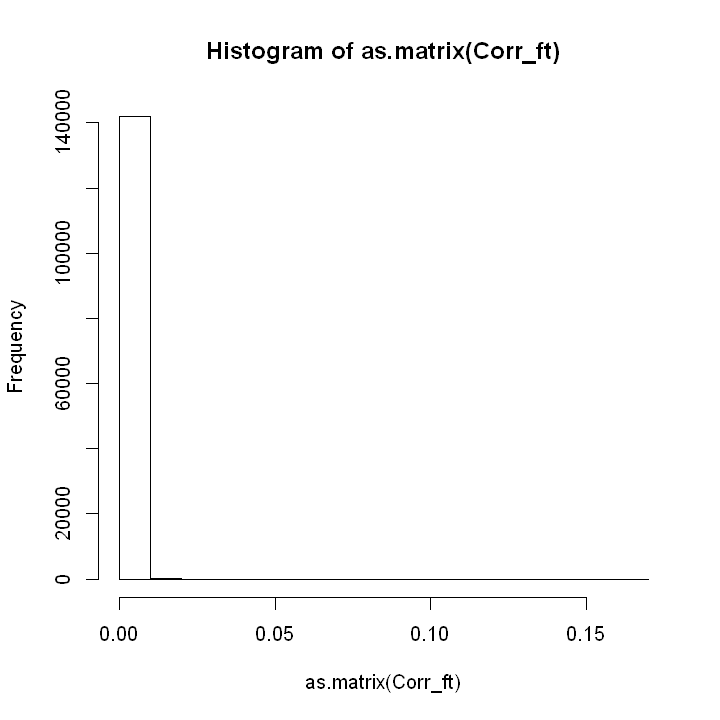

In [64]:
hist(as.matrix(Corr_ft))

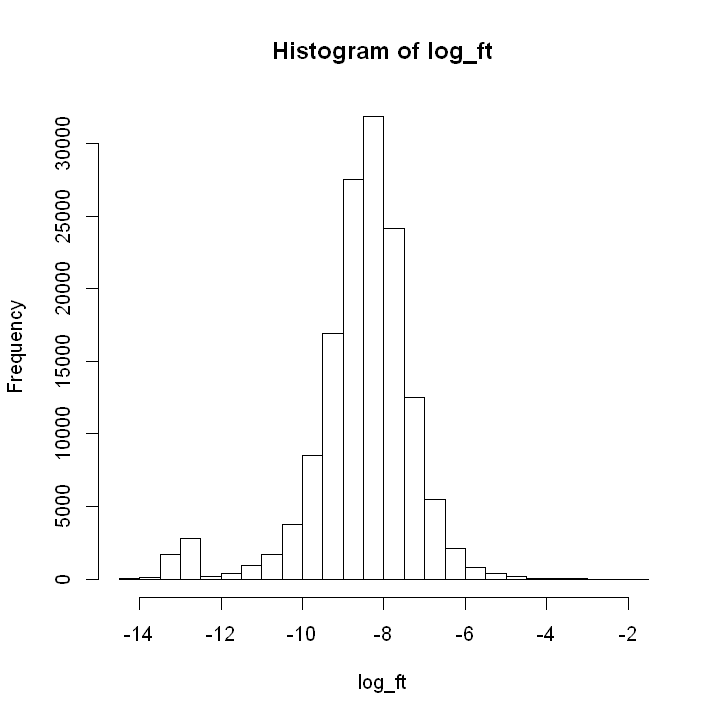

In [65]:
log_ft <- log(as.matrix(Corr_ft))
hist(log_ft)

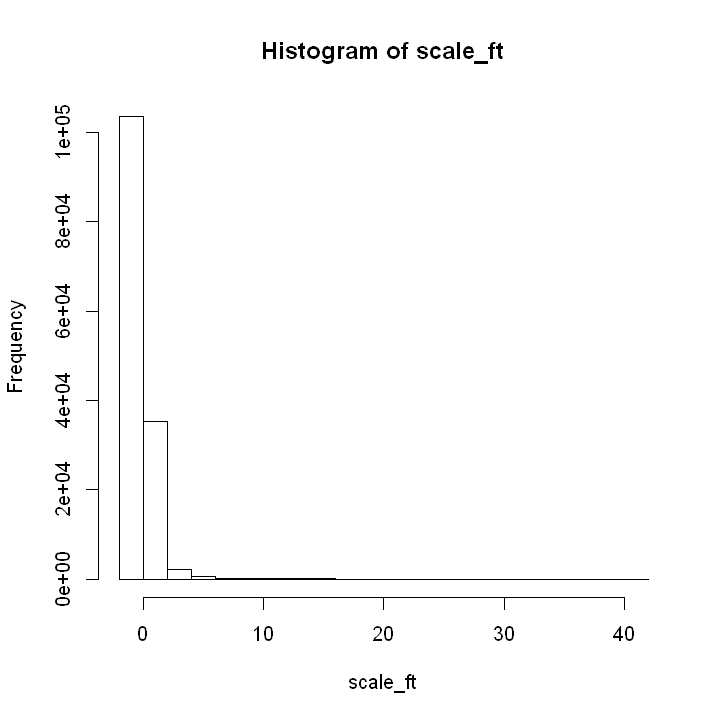

In [66]:
scale_ft <- scale(as.matrix(Corr_ft), center = TRUE, scale = TRUE)
hist(scale_ft)

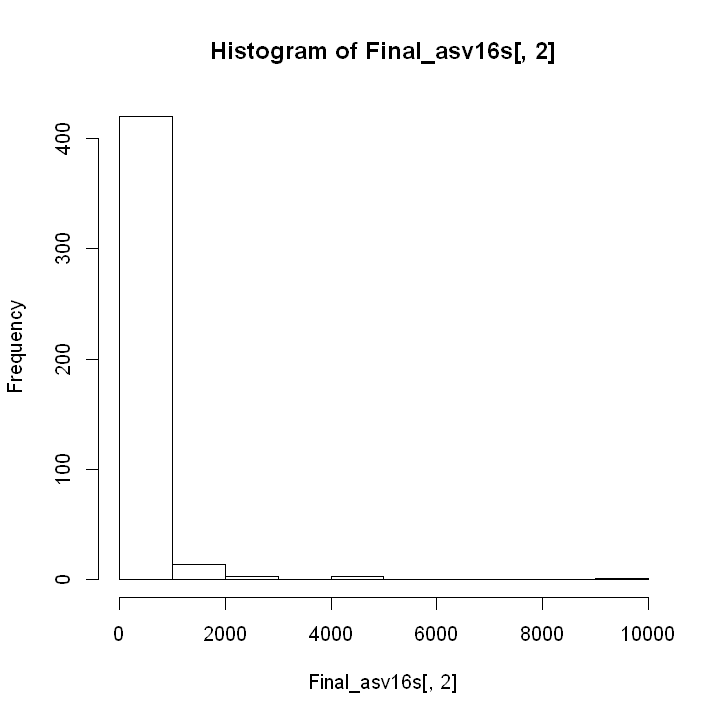

In [67]:
hist(Final_asv16s[,2])

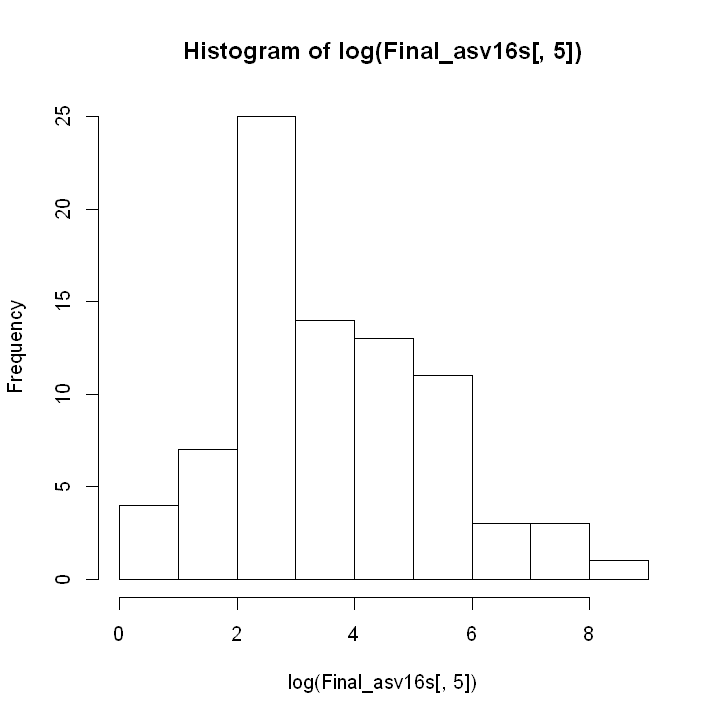

In [68]:
hist(log(Final_asv16s[,5]))

In [69]:
head(Final_asv16s)
dim(Final_asv16s)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_80.mzxml,CCE_P1706_82.mzxml,CCE_P1706_84.mzxml,CCE_P1706_86.mzxml,CCE_P1706_88.mzxml,CCE_P1706_90.mzxml,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml
Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,0,9,0,0,0,0,20,7,0,0,...,17,0,0,0,0,12,22,0,0,0
Bacteria_Verrucomicrobia_Verrucomicrobiae_Opitutales_Puniceicoccaceae_A714019,0,77,80,58,0,0,169,192,103,0,...,158,0,0,0,54,57,140,24,0,0
Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Pseudomonadales_Moraxellaceae_Acinetobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Alteromonadales_Alteromonadaceae_Aestuariibacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


[1] 438  71

In [70]:
head(Final_asv18sv9)
dim(Final_asv18sv9)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_80.mzxml,CCE_P1706_82.mzxml,CCE_P1706_84.mzxml,CCE_P1706_86.mzxml,CCE_P1706_88.mzxml,CCE_P1706_90.mzxml,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml
Eukaryota_Rhizaria_Radiolaria_Acantharea_Acantharea-Group-I_Acantharea-Group-I_X_Acantharea-Group-I_XX,0,14,29,0,0,0,36,52,16,0,...,0,0,0,0,0,45,26,0,0,0
Eukaryota_Rhizaria_Radiolaria_Acantharea_Acantharea-Group-II_Acantharea-Group-II_X_Acantharea-Group-II_XX,0,47,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Eukaryota_Rhizaria_Radiolaria_Acantharea_Acantharea-Group-VI_Acantharea-Group-VI_X_Acantharea-Group-VI_XX,100,0,3,59,6,0,0,0,446,3,...,172,0,0,0,0,0,0,5,0,0
Eukaryota_Rhizaria_Radiolaria_Acantharea_Acantharea_X_Acantharea_XX_Acantharea_XXX,0,71,81,70,36,55,113,74,0,51,...,87,20,25,22,23,29,74,33,6,10
Eukaryota_Opisthokonta_Choanoflagellida_Choanoflagellatea_Acanthoecida_Acanthoecidae_Group_G_Acanthoecidae_Group_G_X,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Eukaryota_Rhizaria_Radiolaria_Acantharea_Arthracanthida-Symphyacanthida_Arthracanthida-Symphyacanthida_X_Acanthometra,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


[1] 603  71

In [71]:
Final_asv1 <- rbind(Final_asv16s,Final_asv18sv9) #combine both asv files
#Final_asv1 <- as.data.frame(Final_asv,stringsAsFactors=F) #converting the table from Matrix form to dataframe 
#Final_asv1 <- as.data.frame(sapply(Final_asv1, as.numeric)) #applying as.numeric to all columns/rows of Final_asv
#rownames(Final_asv1)<- rownames(Final_asv) # The rownames disappear with the previous step. Hence we define it again
dim(Final_asv1)

[1] 1041   71

In [72]:
WithoutZero_ASV <- Final_asv1[rowSums(Final_asv1 != 0) > 0,] #excluding all the rows that has only zeros
dim(WithoutZero_ASV)

Target <- rbind(WithoutZero_ASV,Corr_ft)

[1] 780  71

In [73]:
#Sampling only the colnames and then adding it to the table
set.seed(873465)# Seed for reproducibility
Decoy_asv1 <- WithoutZero_ASV
colnames(Decoy_asv1) <- sample(colnames(WithoutZero_ASV))

Decoy_1 <- rbind(Decoy_asv1,Corr_ft)

In [74]:
head(Target)
dim(Target)

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_80.mzxml,CCE_P1706_82.mzxml,CCE_P1706_84.mzxml,CCE_P1706_86.mzxml,CCE_P1706_88.mzxml,CCE_P1706_90.mzxml,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml
Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,0,9,0,0,0,0,20,7,0,0,...,17,0,0,0,0,12,22,0,0,0
Bacteria_Verrucomicrobia_Verrucomicrobiae_Opitutales_Puniceicoccaceae_A714019,0,77,80,58,0,0,169,192,103,0,...,158,0,0,0,54,57,140,24,0,0
Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Pseudomonadales_Moraxellaceae_Acinetobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Oceanospirillales_Alcanivoracaceae_Alcanivorax,0,30,0,20,0,0,0,14,4,0,...,38,12,0,0,0,3,0,9,0,0


[1] 2780   71

In [75]:
head(Decoy_1)
dim(Decoy_1)

,CCE_P1706_228.mzxml,CCE_P1706_46.mzxml,CCE_P1706_158.mzxml,CCE_P1706_162.mzxml,CCE_P1706_188.mzxml,CCE_P1706_174.mzxml,CCE_P1706_216.mzxml,CCE_P1706_60.mzxml,CCE_P1706_94.mzxml,CCE_P1706_172.mzxml,...,CCE_P1706_114.mzxml,CCE_P1706_218.mzxml,CCE_P1706_186.mzxml,CCE_P1706_208.mzxml,CCE_P1706_220.mzxml,CCE_P1706_100.mzxml,CCE_P1706_106.mzxml,CCE_P1706_164.mzxml,CCE_P1706_122.mzxml,CCE_P1706_156.mzxml
Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,0,9,0,0,0,0,20,7,0,0,...,17,0,0,0,0,12,22,0,0,0
Bacteria_Verrucomicrobia_Verrucomicrobiae_Opitutales_Puniceicoccaceae_A714019,0,77,80,58,0,0,169,192,103,0,...,158,0,0,0,54,57,140,24,0,0
Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Pseudomonadales_Moraxellaceae_Acinetobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Oceanospirillales_Alcanivoracaceae_Alcanivorax,0,30,0,20,0,0,0,14,4,0,...,38,12,0,0,0,3,0,9,0,0


[1] 2780   71

In [38]:
#library(stringr)    #To copy the column names into ppt
#message(paste(colnames(Decoy_1), collapse = ", "))
#message(paste(colnames(Target), collapse = ", "))

CCE_P1706_228.mzxml, CCE_P1706_46.mzxml, CCE_P1706_158.mzxml, CCE_P1706_162.mzxml, CCE_P1706_188.mzxml, CCE_P1706_174.mzxml, CCE_P1706_216.mzxml, CCE_P1706_60.mzxml, CCE_P1706_94.mzxml, CCE_P1706_172.mzxml, CCE_P1706_58.mzxml, CCE_P1706_224.mzxml, CCE_P1706_118.mzxml, CCE_P1706_72.mzxml, CCE_P1706_66.mzxml, CCE_P1706_92.mzxml, CCE_P1706_90.mzxml, CCE_P1706_110.mzxml, CCE_P1706_78.mzxml, CCE_P1706_166.mzxml, CCE_P1706_154.mzxml, CCE_P1706_80.mzxml, CCE_P1706_116.mzxml, CCE_P1706_68.mzxml, CCE_P1706_182.mzxml, CCE_P1706_214.mzxml, CCE_P1706_54.mzxml, CCE_P1706_176.mzxml, CCE_P1706_70.mzxml, CCE_P1706_168.mzxml, CCE_P1706_160.mzxml, CCE_P1706_184.mzxml, CCE_P1706_56.mzxml, CCE_P1706_40.mzxml, CCE_P1706_84.mzxml, CCE_P1706_52.mzxml, CCE_P1706_96.mzxml, CCE_P1706_88.mzxml, CCE_P1706_210.mzxml, CCE_P1706_112.mzxml, CCE_P1706_180.mzxml, CCE_P1706_64.mzxml, CCE_P1706_120.mzxml, CCE_P1706_86.mzxml, CCE_P1706_82.mzxml, CCE_P1706_48.mzxml, CCE_P1706_44.mzxml, CCE_P1706_222.mzxml, CCE_P1706_50.mzx

## Correlation Analysis:

### Transposing the data and putting it in the right format for correlation analysis:
- Here, we transpose the dataframe data_D (This is the Target or decoy dataframe). Transposing make all the numeric data into characters, hence we convert all the values into numeric type again. Then we add another column named "SampleNames" containing the CCE names of the samples. We position it as the 1st column.

### Calculating the correlation of each feature with a sequence column:
1. First we create an empty list &rarr; ct
2. Then we pick each nonfeature i.e. asv sequence column:
    - here, for all the features, we apply the correlation test for this ASV columnn with that of each feature column using the function `cor.test(scale(tab2_D[,i])[,1], scale(tab2_D[,x])[,1]` where i is the ASV column and x is the feature column.
    - Then we get the estimate and p.value for each of the 2000 features for that particular ASV column and store it as a list element. 
    - Thus, we will have list elements equal to the no.of nonfeatures (the 1st list element is NULL). Here each list element is a matrix of 2000 rows and 2 columns  &rarr; estimate and p.value
    
### For the ctm list:
- First, create an empty list &rarr; ctm
- Then, for each list element in ct:
    1. Create an empty matrix of columns = 2, rows = length of nonfeatures ==> ph
    2. Then combine ph matrix to a list element matrix: `ct1 <- rbind(c("cor"," p_value"), ph, ct[[i]])`. Now the dimension of ct1 will be 2781 rows (2000 features + 781 nonfeatures) and 2 columns (cor and p.value)
    3. Then we combine ct1  to our transposed correlation table &rarr; tab2_D (dimension: 2781 rows and 71 columns). Then we subtract the 1st row (Sample names). Thus, the table 'new' will have 2780 rows and 73 columns.
    4. Then, we combine to the 'new' table, a column (containing 0s of length of nonfeatures and 1:2000 indicating the features) and the rownames of 'new'
 
 Here, steps 3,4 are modifying the table for molecular networking mapping in Cytoscape

### <font color= 'red'> Start commenting from "Features passing Bonferronii method"  </font>
 
 
x2 is a matrix, containing features in rows and metadata in columns, the values correspond to the Pearson's product moment correlation coefficient (r). <br>
x is a matrix, containing features in rows and metadata in columns, the values correspond to the p-value (corrected for multiple comparisons using the Bonferroni method) <br>

Run the below code:<br> 
`ct <- list()
for (i in 2){
ct[[i]] <- t(sapply((length(nonfeatures)+1):ncol(tab2_D), function(x) unlist(cor.test(scale(tab2_D[,i])[,1], scale(tab2_D[,x])[,1])[c("estimate", "p.value")])))
}`

`ctm <- list()
for (i in 2){
ph <- matrix(0,nrow=length(nonfeatures)-1,ncol=2)
ct1 <- rbind(c("cor"," p_value"), ph, ct[[i]])
tab3 <- cbind(ct1,  t(as.matrix(tab2_D)))`

`new = tab3[-1,]
new = cbind(c(rep(0,length(nonfeatures)-1),1:(nrow(new)-length(nonfeatures)+1)), rownames(new),new)
rownames(new) <- NULL
colnames(new)[1:2] <- c("shared name", "IDs")
new[1:(length(nonfeatures)-1),1] <- ""
`

In [76]:
dataset <- list(Target, Decoy_1)
final <- list()

In [77]:
for(val in 1:length(dataset)) {
    data_D <- dataset[[val]] 
    IRdisplay::display(head(data_D))
}

,CCE_P1706_100.mzxml,CCE_P1706_102.mzxml,CCE_P1706_104.mzxml,CCE_P1706_106.mzxml,CCE_P1706_108.mzxml,CCE_P1706_110.mzxml,CCE_P1706_112.mzxml,CCE_P1706_114.mzxml,CCE_P1706_116.mzxml,CCE_P1706_118.mzxml,...,CCE_P1706_80.mzxml,CCE_P1706_82.mzxml,CCE_P1706_84.mzxml,CCE_P1706_86.mzxml,CCE_P1706_88.mzxml,CCE_P1706_90.mzxml,CCE_P1706_92.mzxml,CCE_P1706_94.mzxml,CCE_P1706_96.mzxml,CCE_P1706_98.mzxml
Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,0,9,0,0,0,0,20,7,0,0,...,17,0,0,0,0,12,22,0,0,0
Bacteria_Verrucomicrobia_Verrucomicrobiae_Opitutales_Puniceicoccaceae_A714019,0,77,80,58,0,0,169,192,103,0,...,158,0,0,0,54,57,140,24,0,0
Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Pseudomonadales_Moraxellaceae_Acinetobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Oceanospirillales_Alcanivoracaceae_Alcanivorax,0,30,0,20,0,0,0,14,4,0,...,38,12,0,0,0,3,0,9,0,0


,CCE_P1706_228.mzxml,CCE_P1706_46.mzxml,CCE_P1706_158.mzxml,CCE_P1706_162.mzxml,CCE_P1706_188.mzxml,CCE_P1706_174.mzxml,CCE_P1706_216.mzxml,CCE_P1706_60.mzxml,CCE_P1706_94.mzxml,CCE_P1706_172.mzxml,...,CCE_P1706_114.mzxml,CCE_P1706_218.mzxml,CCE_P1706_186.mzxml,CCE_P1706_208.mzxml,CCE_P1706_220.mzxml,CCE_P1706_100.mzxml,CCE_P1706_106.mzxml,CCE_P1706_164.mzxml,CCE_P1706_122.mzxml,CCE_P1706_156.mzxml
Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,0,9,0,0,0,0,20,7,0,0,...,17,0,0,0,0,12,22,0,0,0
Bacteria_Verrucomicrobia_Verrucomicrobiae_Opitutales_Puniceicoccaceae_A714019,0,77,80,58,0,0,169,192,103,0,...,158,0,0,0,54,57,140,24,0,0
Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,4,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Pseudomonadales_Moraxellaceae_Acinetobacter,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Bacteria_Proteobacteria_Gammaproteobacteria_Oceanospirillales_Alcanivoracaceae_Alcanivorax,0,30,0,20,0,0,0,14,4,0,...,38,12,0,0,0,3,0,9,0,0


<b>Took around 20-25 mins to run the next cell:</b> The below cell gets the correlation scores table for both Target and Decoy.

In [ ]:
for(val in 1:length(dataset)) {
    data_D <- dataset[[val]] 
    print(dim(data_D))
    
    # Transpose your data table and put it into the format that will be used for the correlation analysis--------
    data_D_t <- as.data.frame(t(data_D),stringsAsFactors=F)
    head(data_D_t)
    
    nonfeatures <- c(1:(length(colnames(data_D_t)[grepl("\\b[A-Z][a-z]*\\d*", colnames(data_D_t))]))) #getting the length of rownames that has A-Z characters
    print(paste0("The length of nonfeatures:",length(nonfeatures)))
    
    # Calculate the correlation of each feature with metadata:--------------------------------------------------
    ct <- list()
    
    for(i in 1:length(nonfeatures)){
        ct[[i]] <- t(sapply((length(nonfeatures)+1):ncol(data_D_t), 
                            function(x) unlist(cor.test(scale(data_D_t[,i])[,1], scale(data_D_t[,x])[,1],method="spearman",,exact=FALSE)[c("estimate", "p.value")])))
                            }
                            
    ctm <- list()
    
    for (j in 1:length(ct)){
        ph <- matrix(0,nrow=length(nonfeatures),ncol=2)
        ct1 <- rbind(ph, ct[[j]])
        tab3 <- cbind(ct1, as.matrix(data_D))
        
        # for the new table, combining a column of length 2780 (where first 780 values are 0s and then from 1:2000)
        #to rownames of tab3 and tab3
        new <- cbind(c(rep(0,length(nonfeatures)),1:((nrow(tab3)-length(nonfeatures)))), rownames(tab3),tab3)
        rownames(new) <- NULL    #since we already have rownames in a column, we remove them
        colnames(new)[1:2] <- c("shared name", "IDs")   #making the number column as "shared name" and rowname colum as "IDs"
        new[1:length(nonfeatures),1] <- "" #replacing all the zeros of nonfeatures with empty space
        head(new)
        
        # Only Features passing Bonferronii method (not used for nonfeatures):
        # Prepare the new2 table by doing bonferri test only for p values of features 
        # and add it as a column "p_value_corrected" after "p.value" in new table
        new2 <- cbind(new[,1:4], 
                      c(rep(0,length(nonfeatures)), p.adjust(as.numeric(ct1[-c(1:length(nonfeatures)),2]), method = "bonferroni")),
                      new[,-c(1:4)])
        colnames(new2)[5] <- "p_value_corrected"
        ctm[[j]] <- new2
        
    }
    print(paste0("The length of ctm list:",length(ctm)))
                            
    names_ctm <- colnames(data_D_t)[nonfeatures] 
    names(ctm) <- names_ctm
    x <- ctm[[1]][,2]
    x2 <- ctm[[1]][,2]# change here if you want to change to feature numbers instead of names using --> ctm[[1]][,1]

    for (k in 1:length(ctm)){
        x <- cbind(x,ctm[[k]][,which(colnames(ctm[[k]])=="p_value_corrected"),drop=F])
        x2 <- cbind(x2,ctm[[k]][,which(colnames(ctm[[k]])=="estimate.cor"),drop=F])
    }

    colnames(x) <- c("SampleNames",names(ctm))
    x <- x[-nonfeatures,]
    colnames(x2) <- c("SampleNames",names(ctm))
    x2 <- x2[-nonfeatures,]

    # create correlation matrices: useful for heatmap
    #correl_x2 <- apply(x2[,-1], 2, as.numeric)
    #rownames(correl_x2) <- x2[,1]
    #correl_x <- apply(x[,-1], 2, as.numeric)
    #rownames(correl_x) <- x[,1]

    # create output tables
    y <- as.data.frame(x,stringsAsFactors = F)
    y2 <- as.data.frame(x2,stringsAsFactors = F)
    y$SampleNames <- as.factor(y$SampleNames)
    y2$SampleNames <- as.factor(y2$SampleNames)
    y[,-1] <- sapply(y[,-1], as.numeric) #except 1st column "SampleNames", make everything to numeric type
    y2[,-1] <- sapply(y2[,-1], as.numeric)

    y <- melt(y)
    y2 <- melt(y2)

    y3 <- cbind(y[,c(1:3)],y2[,3])
    y3 <- cbind(y3, (y2[,3])^2)
    colnames(y3)[c(1,3:5)] <- c("Feature","pvalue","correlation_coef","r2")

    dim(y3)

    final[[val]] <- y3                    
  }

[1] 2780   71
[1] "The length of nonfeatures:780"


Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message in cor.test.default(scale(data_D_t[, i])[, 1], scale(data_D_t[, :
"Cannot compute exact p-value with ties"
Warning message 

In [50]:
length(final)
hist_Target <- final[[1]]
hist_Decoy <- final[[2]]
head(hist_Target,3)
head(hist_Decoy,3)

[1] 2

Feature,variable,pvalue,correlation_coef,r2
4969_312.143_3.34,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.1580002,0.02496406
34346_542.324_9.708,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.2801816,0.07850172
17812_354.191_5.62,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.1146348,0.01314114


Feature,variable,pvalue,correlation_coef,r2
4969_312.143_3.34,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.02404868,0.0005783392
34346_542.324_9.708,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.04254844,0.0018103696
17812_354.191_5.62,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.09157584,0.0083861344


In [51]:
write.table(hist_Target,"20221109_CorrelationTable_Metadata_Target_FixedData.csv",row.names = F,quote = F,sep=";")
write.table(hist_Decoy,"20221109_CorrelationTable_Metadata_Decoy_colnames_shuffled_FixedData.csv",row.names = F,quote = F,sep=";")

In [148]:
hist_Target <- read.csv("20221109_CorrelationTable_Metadata_Target_FixedData.csv",sep=";")
hist_Decoy <- read.csv("20221109_CorrelationTable_Metadata_Decoy_colnames_shuffled_FixedData.csv",sep=";")

Warning message in file(file, "rt"):
"cannot open file '20221109_CorrelationTable_Metadata_Target.csv': No such file or directory"

ERROR: Error in file(file, "rt"): cannot open the connection


In [52]:
identical(hist_Target,hist_Decoy)

[1] FALSE

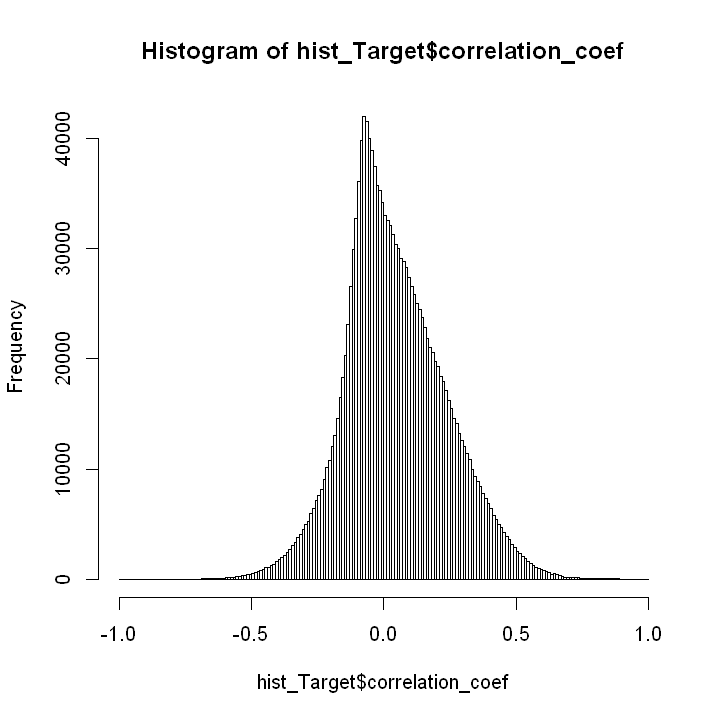

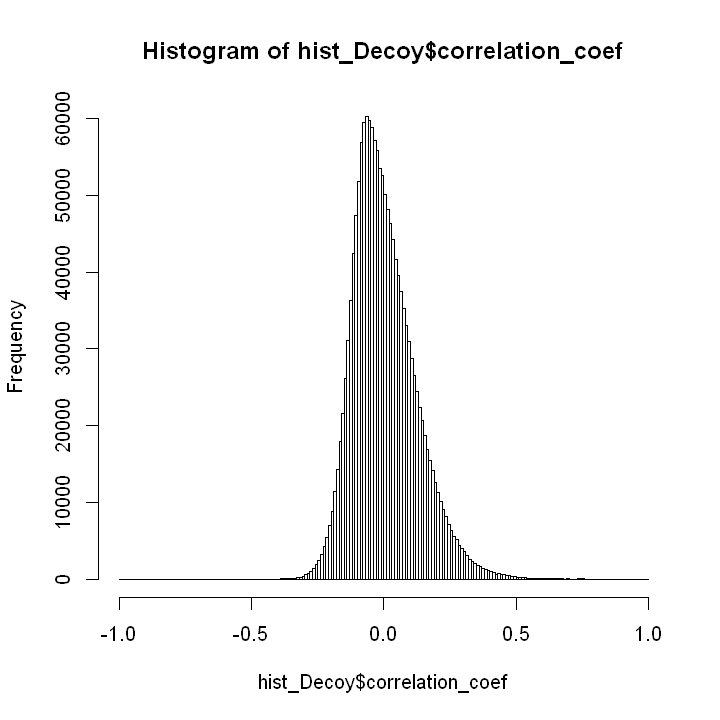

In [53]:
p1 <- hist(hist_Target$correlation_coef,breaks = seq(-1,1, length.out = 201))
p2 <- hist(hist_Decoy$correlation_coef,breaks=seq(-1,1, length.out = 201))

target_histogram <- data.frame("Breaks"=(p1$breaks[-1]),"Counts"=(p1$counts))
decoy_histogram <- data.frame("Breaks"=(p2$breaks[-1]),"Counts"=(p2$counts))

target_histogram$decoy <- 0
decoy_histogram$decoy <- 1

Run the below code as it is with commented lines to visualise the plot. **To save the plot as pdf or png**, rerun the same below code after uncommenting ('Remove #') the respective line:

null device 
          1

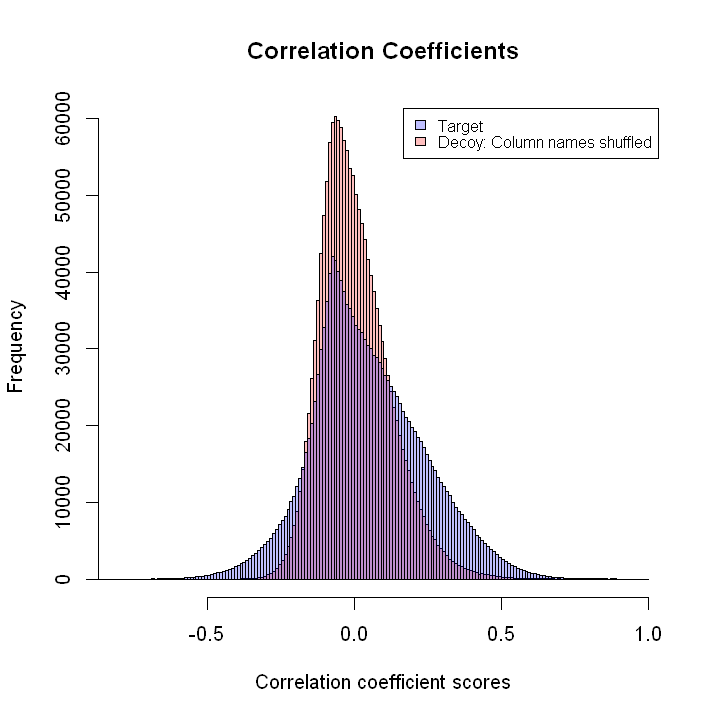

In [54]:
#pdf('Combined_histplot.pdf') #saving the plot as pdf
#png('20221027_Combined_histplot_oldData.png') #saving the plot as png
plot(p2, col=rgb(1,0,0,1/4),xlim=c(-0.8,1),main = "Correlation Coefficients", xlab="Correlation coefficient scores")  
plot( p1, col=rgb(0,0,1,1/4), 
      add=T)
legend("topright", inset=.02,
       c("Target","Decoy: Column names shuffled"), fill=c("#0000FF40","#FF000040"), horiz=F, cex=0.8)
dev.off()

In [55]:
head(target_histogram)

Breaks,Counts,decoy
-0.99,0,0
-0.98,0,0
-0.97,0,0
-0.96,0,0
-0.95,0,0
-0.94,0,0


### For 100% FDR:

In [56]:
TD <- cbind(target_histogram[,-3],decoy_histogram$Counts) #combining both Target and decoy bins
colnames(TD) <- c('Breaks', 'T_C','D_C')

Here, we are considering all bin values greater than or equal to 0 from TD as Positive FDR and the bins less than 0 as Negative FDR.

In [60]:
Pos_FDR <- TD %>% filter(Breaks >= 0)
Neg_FDR <- TD %>% filter(Breaks < 0)
Pos_FDR <- Pos_FDR %>% as.data.frame() %>% arrange(desc(Breaks)) # arranging by descending order of corr coeff 
Neg_FDR <- Neg_FDR %>% as.data.frame() %>% arrange(Breaks) # arranged from smallest to largest ==> most negative to close to 0 values

head(Pos_FDR)

Breaks,T_C,D_C
1.00,9,0
0.99,1,1
0.98,1,0
0.97,5,0
0.96,2,0
0.95,4,2


In the subset version, from the TD table, we consider bin values within the range $ 0 \leq Bins < 0.8$ for Positive FDR and range $ -0.8 < Bins < 0$ for Negative FDR

In [58]:
Pos_FDR_subset <- TD %>% filter(Breaks >= 0 & Breaks < 0.8)
Neg_FDR_subset <- TD %>% filter(Breaks < 0 & Breaks > -0.8)
Pos_FDR_subset <- Pos_FDR_subset %>% as.data.frame() %>% arrange(desc(Breaks)) # arranging by descending order of corr coeff 
Neg_FDR_subset <- Neg_FDR_subset %>% as.data.frame() %>% arrange(Breaks) # arranged from smallest to largest ==> most negative to close to 0 values

head(Pos_FDR_subset)

Breaks,T_C,D_C
0.79,51,7
0.78,71,9
0.77,53,6
0.76,98,25
0.75,100,15
0.74,105,19


Now we calculate the FDR values: (Keep only FDR_subset; Remove other 2 cells)

In [61]:
Pos_FDR$fdr <- NA
for (i in 1:nrow(Pos_FDR)){
  temp <- Pos_FDR %>% filter(Breaks >= Pos_FDR$Breaks[i])
  Pos_FDR$fdr[i] <- sum(temp$D_C)/sum(temp$T_C)
}

Neg_FDR$fdr <- NA
for (i in 1:nrow(Neg_FDR)){
  temp <- Neg_FDR %>% filter(Breaks <= Neg_FDR$Breaks[i])
  Neg_FDR$fdr[i] <- sum(temp$D_C)/sum(temp$T_C)
}

Pos_FDR$round_fdr <- round(Pos_FDR$fdr, digits = 2)
Neg_FDR$round_fdr <- round(Neg_FDR$fdr, digits = 2)

head(Pos_FDR)
head(Neg_FDR)

Breaks,T_C,D_C,fdr,round_fdr
1.00,9,0,0.00000000,0.00
0.99,1,1,0.10000000,0.10
0.98,1,0,0.09090909,0.09
0.97,5,0,0.06250000,0.06
0.96,2,0,0.05555556,0.06
0.95,4,2,0.13636364,0.14


Breaks,T_C,D_C,fdr,round_fdr
-0.99,0,0,NaN,NaN
-0.98,0,0,NaN,NaN
-0.97,0,0,NaN,NaN
-0.96,0,0,NaN,NaN
-0.95,0,0,NaN,NaN
-0.94,0,0,NaN,NaN


In [62]:
Pos_FDR_subset$fdr <- NA
for (i in 1:nrow(Pos_FDR_subset)){
  temp <- Pos_FDR_subset %>% filter(Breaks >= Pos_FDR_subset$Breaks[i])
  Pos_FDR_subset$fdr[i] <- sum(temp$D_C)/sum(temp$T_C)
}

Neg_FDR_subset$fdr <- NA
for (i in 1:nrow(Neg_FDR_subset)){
  temp <- Neg_FDR_subset %>% filter(Breaks <= Neg_FDR_subset$Breaks[i])
  Neg_FDR_subset$fdr[i] <- sum(temp$D_C)/sum(temp$T_C)
}

#rounding the fdr upto 2 digits
Pos_FDR_subset$round_fdr <- round(Pos_FDR_subset$fdr, digits = 2) 
Neg_FDR_subset$round_fdr <- round(Neg_FDR_subset$fdr, digits = 2)

head(Pos_FDR_subset)

Breaks,T_C,D_C,fdr,round_fdr
0.79,51,7,0.1372549,0.14
0.78,71,9,0.1311475,0.13
0.77,53,6,0.1257143,0.13
0.76,98,25,0.1721612,0.17
0.75,100,15,0.1662198,0.17
0.74,105,19,0.1694561,0.17


In [63]:
head(Neg_FDR_subset)

Breaks,T_C,D_C,fdr,round_fdr
-0.79,0,0,NaN,NaN
-0.78,0,0,NaN,NaN
-0.77,0,0,NaN,NaN
-0.76,1,0,0,0
-0.75,1,0,0,0
-0.74,1,0,0,0


Here, we subset the Positive and Negative FDR tables for $0$ to $ \pm 0.8 $ range after calculating FDR values:

In [64]:
Neg_FDR_newVal <- Neg_FDR %>% filter(Breaks > -0.8) #Specifying the limits of correlation scores for Neg_FDR 
Pos_FDR_newVal <- Pos_FDR %>% filter(Breaks < 0.8)  #Specifying the limits of correlation scores for Pos_FDR

head(Neg_FDR_newVal)
head(Pos_FDR_newVal)

Breaks,T_C,D_C,fdr,round_fdr
-0.79,0,0,NaN,NaN
-0.78,0,0,NaN,NaN
-0.77,0,0,NaN,NaN
-0.76,1,0,0,0
-0.75,1,0,0,0
-0.74,1,0,0,0


Breaks,T_C,D_C,fdr,round_fdr
0.79,51,7,0.1119593,0.11
0.78,71,9,0.1142241,0.11
0.77,53,6,0.1141199,0.11
0.76,98,25,0.1365854,0.14
0.75,100,15,0.1384615,0.14
0.74,105,19,0.1439024,0.14


Here, we try to plot the FDR plots with full range (-1 to 1 correlation scores) along with the FDR values subsetted before and after FDR calculation to observe the change in FDR calculation:

null device 
          1

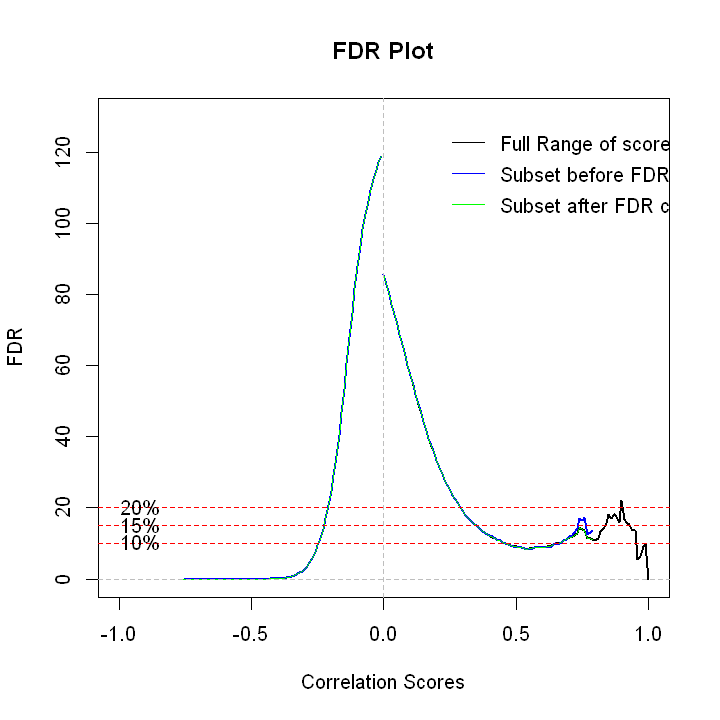

In [65]:
#svglite(filename="20220928_FDR_plot_comparison.svg") #saving the plot as svg
#png("20220928_FDR_plot_comparison.png") #saving the plot as png
plot(Pos_FDR$Breaks,((Pos_FDR$fdr)*100), xlim=c(-1,1),t='l',lwd=2.0, ylim=c(0,130), xlab = 'Correlation Scores', ylab='FDR', main='FDR Plot')
lines(Neg_FDR$Breaks,((Neg_FDR$fdr)*100),lwd=2.0)

lines(Neg_FDR_subset$Breaks,((Neg_FDR_subset$fdr)*100),lwd=2.0,col="blue")
lines(Pos_FDR_subset$Breaks,((Pos_FDR_subset$fdr)*100),lwd=2.0,col="blue")

lines(Neg_FDR_newVal$Breaks,((Neg_FDR_newVal$fdr)*100),lwd=1.0,col="green")
lines(Pos_FDR_newVal$Breaks,((Pos_FDR_newVal$fdr)*100),lwd=1.0,col="green")

abline(h=0,v=0, col="gray",lty=2)
abline(h=c(10,15,20), col="red",lty=2)
text(-0.8, c(10,15,20), c("10%","15%","20%"), pos=2, cex=1)
legend(0.2,130,   # Position
       legend = c("Full Range of scores", "Subset before FDR calculation","Subset after FDR calculation"),
       bty="n", #specifying the box type is none
       col = c("black","blue","green"), #color of the lines
       y.intersp= 1.5, #line space
       lwd = 1, #line width
       cex=1 ) # text size

dev.off()

In [66]:
FDR_full <- rbind(Neg_FDR_subset,Pos_FDR_subset) #combining both negative and positive fdr
head(FDR_full)

Breaks,T_C,D_C,fdr,round_fdr
-0.79,0,0,NaN,NaN
-0.78,0,0,NaN,NaN
-0.77,0,0,NaN,NaN
-0.76,1,0,0,0
-0.75,1,0,0,0
-0.74,1,0,0,0


In [140]:
# Creating a Cutoff table
Cutoff_table <- data.frame(matrix(ncol = 3, nrow = 3))
colnames(Cutoff_table) <- c("FDR %","Positive Cutoff","Negative Cutoff")
Cutoff_table$"FDR %"<- c(10,15,20)

In [141]:
Other_Ranges_Cutoff <- data.frame(matrix(ncol = 3, nrow = 8))
colnames(Other_Ranges_Cutoff) <- c("FDR %","Positive Cutoff","Negative Cutoff")
Other_Ranges_Cutoff$"FDR %" <- c(9,11,12,14,16,19,21,22)

In [107]:
# listing the desired FDR values and their range
desired_FDR <- list("0.09|0.11|0.12","0.14|0.16","0.19|0.21|0.22")
desired_FDR
FDR_original <- c(0.10,0.15,0.20)

[[1]]
[1] "0.09|0.11|0.12"

[[2]]
[1] "0.14|0.16"

[[3]]
[1] "0.19|0.21|0.22"

In [108]:
desired_FDR2 <- list(c(0.09,0.11,0.12),c(0.14,0.16),c(0.19,0.21,0.22))

In [109]:
desired_FDR2

[[1]]
[1] 0.09 0.11 0.12

[[2]]
[1] 0.14 0.16

[[3]]
[1] 0.19 0.21 0.22

In [70]:
isTRUE(any(Pos_FDR_subset$round_fdr==FDR_original[1]))

[1] TRUE

<p style='text-align: justify;'> The below for loop gets the cutoff values using the following steps: <br>
1) If the rounded fdr values in Pos_FDR and Neg_FDR table contains the actual values of interested FDR as given in "FDR_original" &rarr; 0.10,0.15,0.20 then pick the row. When there are multiple rows with the same FDR values, go for the one with minimum FDR value. <br>
2) If the actual values are not present, look for the nearest FDR values as mentioned in the desired_FDR list and slice the corresponding row from the FDR tables as mentioned in step 1 <br>
3) Then insert the correlation score (i.e Breaks here) corresponding to the FDR into the cutoff table. When no value is present, mention it by NA</p>

In [142]:
Other_Ranges_Cutoff

FDR %,Positive Cutoff,Negative Cutoff
9,NA,NA
11,NA,NA
12,NA,NA
14,NA,NA
16,NA,NA
19,NA,NA
21,NA,NA
22,NA,NA


In [153]:
lengths(desired_FDR2)

[1] 3

In [149]:
x<- c()
for(j in 1:length(desired_FDR2)){
    for(i in lengths(desired_FDR2)){
    x<- Pos_FDR_subset %>% filter(grepl(desired_FDR2[[j]][i], round_fdr)) %>% slice(which.min(fdr))
    x <- rbind(x,x)
    IRdisplay::display(x)
}
}

Breaks,T_C,D_C,fdr,round_fdr
0.56,1419,100,0.08528506,0.09


Breaks,T_C,D_C,fdr,round_fdr
0.44,4985,695,0.1073212,0.11


Breaks,T_C,D_C,fdr,round_fdr
0.41,6445,1051,0.1184772,0.12


In [134]:
lengths(desired_FDR2)[1]

[1] 3

In [ ]:
for(j in 1:lengths(desired_FDR2)){
    x <- Pos_FDR_subset %>% filter(grepl(desired_FDR[[i]], round_fdr)) %>% slice(which.min(fdr))
    }

In [ ]:
ct <- list()
    
    for(i in 1:length(nonfeatures)){
        ct[[i]] <- t(sapply((length(nonfeatures)+1):ncol(data_D_t), 
                            function(x) unlist(cor.test(scale(data_D_t[,i])[,1], scale(data_D_t[,x])[,1])[c("estimate", "p.value")])))
                            }

In [ ]:
i <- 1
x <- Pos_FDR_subset %>% filter(grepl(FDR_original[i],round_fdr)) %>% slice(which.min(fdr))
y <- Neg_FDR_subset %>% filter(grepl(desired_FDR[[i]], round_fdr)) %>% slice(which.min(fdr))


In [91]:

for(i in 1:length(FDR_original)){
    for(j in 1:lengths(desired_FDR2)){
        if(isTRUE(any(Pos_FDR_subset$round_fdr==FDR_original[j]))){
            x <- Pos_FDR_subset %>% filter(grepl(FDR_original[j],round_fdr)) %>% slice(which.min(fdr))} else{
            x <- Pos_FDR_subset %>% filter(grepl(desired_FDR[[i]], round_fdr)) %>% slice(which.min(fdr))}
        if(isTRUE(any(Neg_FDR_subset$round_fdr==FDR_original[i]))){
            y <- Neg_FDR_subset %>% filter(grepl(FDR_original[i],round_fdr)) %>% slice(which.min(fdr))} else{
            y <- Neg_FDR_subset %>% filter(grepl(desired_FDR[[i]], round_fdr)) %>% slice(which.min(fdr))}
        
        if(nrow(x)==0){Cutoff_table$"Positive Cutoff"[i] <- NA} else{Cutoff_table$"Positive Cutoff"[i] <- x$Breaks}
        if(nrow(y)==0){Cutoff_table$"Negative Cutoff"[i] <- NA} else{Cutoff_table$"Negative Cutoff"[i] <- y$Breaks}
}}

In [92]:
Cutoff_table

FDR %,Positive Cutoff,Negative Cutoff
10,0.64,-0.25
15,0.35,-0.23
20,0.29,-0.21


null device 
          1

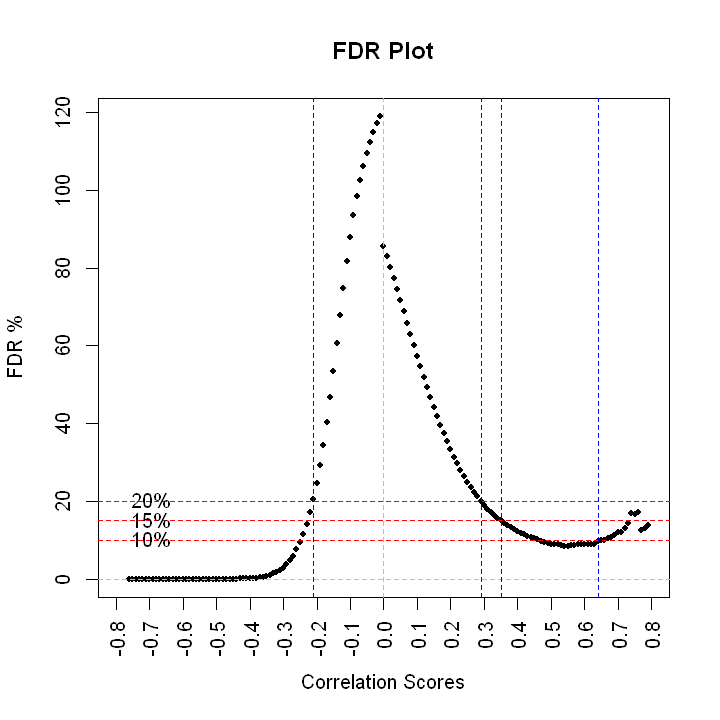

In [73]:
#svglite(filename="20221025_FDR_plot_Cutoff.svg") #saving the plot as svg
#png("20220928_FDR_plot_comparison.png") #saving the plot as png
plot(FDR_full$Breaks,((FDR_full$fdr)*100), xaxt='n',xlab = 'Correlation Scores', ylab='FDR %', main='FDR Plot',pch=20)  
axis(1, at = seq(-0.8,0.8,by = 0.1), las=2)
abline(h=0,v=0, col="gray",lty=2)
abline(h=c(10,15,20), col="red",lty=2)
abline(v=Cutoff_table$'Positive Cutoff', col="blue",lty=2)
abline(v=Cutoff_table$'Negative Cutoff', col="blue",lty=2)
text(-0.6, c(10,15,20), c("10%","15%","20%"), pos=2, cex=1)

dev.off()

<font color='red'> <b> Indicate the cut-off for negative and positive correlation scores in the below cell: </b></font> Scores only above the cutoff (or below for Neg_FDR) will be selected for further processing.

In [154]:
Neg_FDR_Cutoff <- -0.4
Pos_FDR_Cutoff <- 0.6

In [155]:
head(hist_Target,n=3)

Feature,variable,pvalue,correlation_coef,r2
4969_312.143_3.34,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.1580002,0.02496406
34346_542.324_9.708,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.2801816,0.07850172
17812_354.191_5.62,Bacteria_Proteobacteria_Gammaproteobacteria_Francisellales_Francisellaceae_[Caedibacter] taeniospiralis group,1,-0.1146348,0.01314114


In [156]:
FDR_Decoy<- hist_Decoy %>% filter(correlation_coef < Neg_FDR_Cutoff | correlation_coef > Pos_FDR_Cutoff)
FDR_Target <- hist_Target %>% filter(correlation_coef < Neg_FDR_Cutoff | correlation_coef > Pos_FDR_Cutoff )

In [157]:
head(FDR_Decoy)

Feature,variable,pvalue,correlation_coef,r2
19428_381.155_6.013,Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,8.111295e-06,0.6296278,0.3964312
24262_379.175_6.909,Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,2.231746e-08,0.6998380,0.4897733
22322_407.17_6.566,Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,3.212168e-08,0.6960148,0.4844365
26342_447.201_7.173,Bacteria_Acidobacteria_Holophagae_Acanthopleuribacterales_Acanthopleuribacteraceae_Acanthopleuribacter,2.367423e-08,0.6992225,0.4889120
12239_182.19_4.648,Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,1.675865e-07,0.6778935,0.4595396
32210_727.453_9.026,Bacteria_Proteobacteria_Gammaproteobacteria_Betaproteobacteriales_Burkholderiaceae_Achromobacter,2.442430e-06,0.6455030,0.4166742


In [158]:
levels(as.factor(round(FDR_Target$correlation_coef, 1)))

[1] "-0.8" "-0.7" "-0.6" "-0.5" "-0.4" "0.6"  "0.7"  "0.8"  "0.9"  "1"

In [159]:
#write.table(FDR_Decoy,"20221109_Decoy_subsetted_FDR.csv",row.names = F,quote = F,sep=';')
#write.table(FDR_Target,"20221109_Target_subsetted_FDR.csv",row.names = F,quote = F,sep=';')

In [163]:
write.csv(FDR_Target,"20221109_Target_subsetted_FDR.csv")
write.csv(FDR_Decoy,"20221109_Decoy_subsetted_FDR.csv")